# World Data League 2023

## 🎯 Challenge
Determining The Main Mobility Flows in the City of Lisbon Based on Mobile Device Data


## Team Name
AI Wonder Girls


## 👥 Authors
* Emma Roscow
* Ernitia Paramasari
* Pankaja Shankar
* Divya Kamat


## 💻 Development

Lisbon faces challenges to meet its goals of creating safe, accessible, and integrated sustainable transport. Currently, many of the 2.8 million inhabitants of the Lisbon Metropolitan Area commute by car to the city each day, causing congestion, a less safe environment for residents, and greenhouse gas emissions.

In our solution, we have:
* analysed how commuters from outside Lisbon enter and move around the city
* trained a machine learning model to predict the flow of mobile devices around the busiest grids in the city
* identified ways that soft mobility options can be improved to serve the needs of commuters from beyond Lisbon, to discourage the use of private cars and meet the city's sustainable transport goals

In this notebook we outline the insights we gained from our analysis and modelling. We used the datasets provided to train a prototype of a temporal graph convolutional network to predict movement around the gridded locations of Lisbon from mobile devices. Owing to the ambitious nature of the model, we have trained it but have so far been unable to extract the learned edge weights or make predictions on new data. For the purposes of demonstrating proof of concept, we use a simple baseline model to demonstrate the value that our completed graph neural network can have once fully developed.

The model learns the strength of connections between the grids, which we exploit to find the most popular routes that people take around the city during that crucial rush hour window. This is comprehensive tool, albeit a prototype, and we use it to focus on the flow of commuters: i.e. people arriving into the city from outside, from their non-roaming mobile devices. Given more time, we would extend this model in various ways, including using entries to the city via the axes as additional features; but for this prototype, we use the grids adjacent to the axes instead as a proxy for arrivals into the city from the surrounding metropolitan area. We analyse the routes that people take around the city, where they are heading to, and how well the current soft mobility infrastructure serves those routes to provide viable alternatives to driving. We find that more bus routes and cycling infrastructure could be directed to meet the needs of these commuters. Finally, we provide estimates of how changing flows around the city can impact carbon emissions to help Lisbon meet its goals for reducing greenhouse gas emissions.

For this analysis, we focus on:

1. residents of Portugal (non-roaming devices)

2. commuters (activity during morning weekday rush hours)

3. commuters arriving from outside the city of Lisbon (arriving via the 11 axes)

## We want to know:
1.  Where do people predominantly go after arriving in the city? How do they get there? This can suggest the primary routes that city planners can use to optimise infrastructure and services.

2.  What are the options for public transport routes and cycling infrastructure to get to the primary destinations? Is such infrastructure serving commuters well? This can help city planners improve soft mobility infrastructure where it is needed most during morning rush hours.

3.  If commuters can be redirected (for example, by taking the train instead of driving into the city), what would be the impact on flow? This can help city planners identify the potential impact of new interventions in the Lisbon Metropolitan Area.

## 0 Training and validating the T-GCN graph neural network

Our model is designed to predict the flow of mobile devices in the busiest areas of the city, using advanced network-based traffic forecasting techniques. By leveraging the power of the temporal graph convolutional network (T-GCN) model, we are able to capture complex spatio-temporal correlations from traffic data, allowing us to make predictions. The model is based on a graph neural network architecture, with the city grids serving as nodes, their entries and exits per timestamp as node features, and distance as edge features for the adjacency matrix. 

This is a PyTorch implementation of T-GCN in the following paper: [T-GCN: A Temporal Graph Convolutional Network for Traffic Prediction](https://arxiv.org/abs/1811.05320).

The model is based on [this](https://github.com/lehaifeng/T-GCN/tree/master/T-GCN/T-GCN-PyTorch) repo.


In [ ]:
!git clone https://github.com/divya-r-kamat/T-GCN.git
%cd /content/T-GCN/T-GCN/T-GCN-PyTorch
!pip install -r requirements.txt


In [ ]:
import pandas as pd
import math
df_grid_train = pd.read_csv("Processed data/train_val_test_splits_for_graph_model/grid_train_125.csv", index_col=0, header=[0, 1])
df_grid_val = pd.read_csv("Processed data/train_val_test_splits_for_graph_model/grid_val_125.csv", index_col=0, header=[0, 1])
df_grid_test = pd.read_csv("Processed data/train_val_test_splits_for_graph_model/grid_test_125.csv", index_col=0, header=[0, 1])

df_grid = pd.concat([df_grid_train, df_grid_val], axis=0)
df_pos = pd.read_excel("Raw data/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")


Create a dictionary that maps the grid ID to its coordinates

In [ ]:
pos_dict = {}
for _, row in df_pos.iterrows():
    pos_dict[row['grelha_id']] = (row['latitude'], row['longitude'])

To create an adjacency matrix, we need to define the relationships between the nodes. In the case of a grid network, we can define the relationships between nodes based on their spatial proximity.

In [ ]:
#function to calculate the distance between two points given the coordinates


def distance(pos1, pos2):
    lat1, long1 = pos1
    lat2, long2 = pos2
    radius = 6371  # Earth radius in km
    dlat = math.radians(lat2-lat1)
    dlong = math.radians(long2-long1)
    a = math.sin(dlat/2) * math.sin(dlat/2) + math.cos(math.radians(lat1)) \
        * math.cos(math.radians(lat2)) * math.sin(dlong/2) * math.sin(dlong/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    return radius * c


Creates adjacency matrix

In [ ]:
adj_matrix = pd.DataFrame(0, index=df_grid.columns, columns=df_grid.columns)

# Calculate minimum distance
min_distance = float('inf')

for i in range(len(df_grid.columns)):
    for j in range(i+1, len(df_grid.columns)):
        pos1 = pos_dict[int(df_grid.columns[i][1])]
        pos2 = pos_dict[int(df_grid.columns[j][1])]
        dist = distance(pos1, pos2)
        if dist < min_distance and dist!= 0.0:
            min_distance = dist


for i in range(len(df_grid.columns)):
    for j in range(i+1, len(df_grid.columns)):
        pos1 = pos_dict[int(df_grid.columns[i][1])]
        pos2 = pos_dict[int(df_grid.columns[j][1])]
        dist = distance(pos1, pos2)
        #adj matrix distance
        if dist < min_distance:  # Define a threshold for spatial proximity
            adj_matrix.iloc[i,j] = 1
            adj_matrix.iloc[j,i] = 1

print(adj_matrix.shape)
adj_matrix.to_csv('/content/T-GCN/T-GCN/T-GCN-PyTorch/data/grid_adj.csv', index=False,header=False)

(2510, 2510)


Creates feature matrix for non-roaming exits

In [ ]:
feature_matrx = pd.DataFrame(index=df_grid.index, columns=df_grid.columns.get_level_values(1))

for grid_id in df_grid.columns.get_level_values(1):
    feature_matrx[grid_id] = df_grid['non-roaming_exits'][f'{grid_id}'].fillna(0).values

Creates feature matrix for non-roaming entries

In [ ]:
feature_matrix = pd.DataFrame(index=df_grid.index, columns=df_grid.columns.get_level_values(1))

for grid_id in df_grid.columns.get_level_values(1):
    feature_matrix[grid_id] = df_grid['non-roaming_entries'][f'{grid_id}'].fillna(0).values
print(feature_matrix.shape)
feature_matrix.to_csv('/content/T-GCN/T-GCN/T-GCN-PyTorch/data/feature_matrix.csv', index=False, header=False)

(4933, 2510)


Model training and validation

In [ ]:
!python /content/T-GCN/T-GCN/T-GCN-PyTorch/main.py --model_name TGCN --max_epochs 20  --learning_rate 0.01 --weight_decay 0 --batch_size 32 --hidden_dim 64 --loss mse_with_regularizer --settings supervised --gpus 1

2023-04-20 09:03:19.045468: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-20 09:03:20.060814: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
[2023-04-20 09:03:21,853 INFO]{'logger': True, 'checkpoint_callback': True, 'default_root_dir': None, 'gradient_clip_val': 0.0, 'gradient_clip_algorithm': 'norm', 'process_position': 0, 'num_nodes': 1, 'num_processes': 1, 'gpus': 1, 'auto_select_gpus': False, 'tpu_cores': None, 'log_gpu_memory': None, 'progress_bar_refresh_rate': None, 'overfit_batches': 0.0, 'track_grad_norm': -1, 'check_val_every_n_epoch': 1, 'fast_dev_run': False, 'accumulate_grad_batches': 1, 'max_epochs': 20, 'min_epochs': None, 'max_steps': None, 'min_steps': None, 'max_time': None, 'l

Run tensorboard --logdir lightning_logs/version_[n] to monitor the training progress and view the prediction results.

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=/content/T-GCN/T-GCN/T-GCN-PyTorch/lightning_logs/version_2

Reusing TensorBoard on port 6006 (pid 42229), started 0:27:24 ago. (Use '!kill 42229' to kill it.)

<IPython.core.display.Javascript object>

Model Predictions

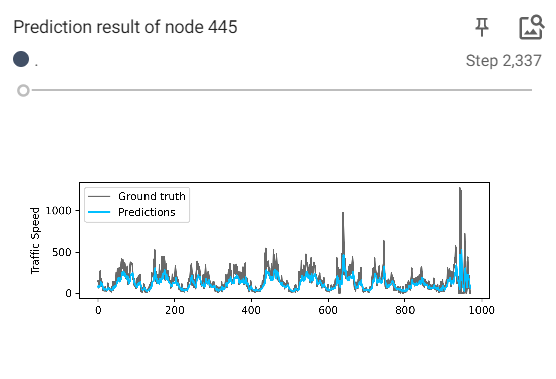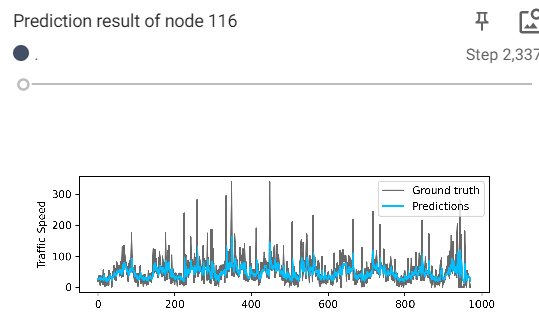

Training and Test Metrics

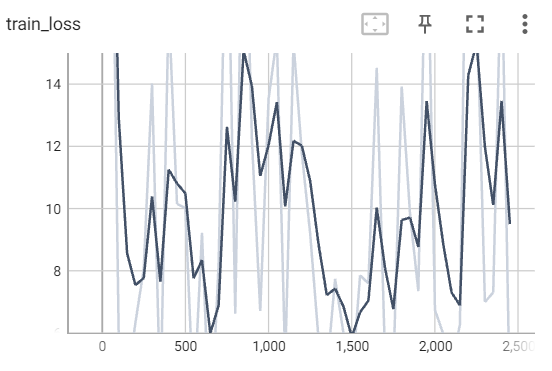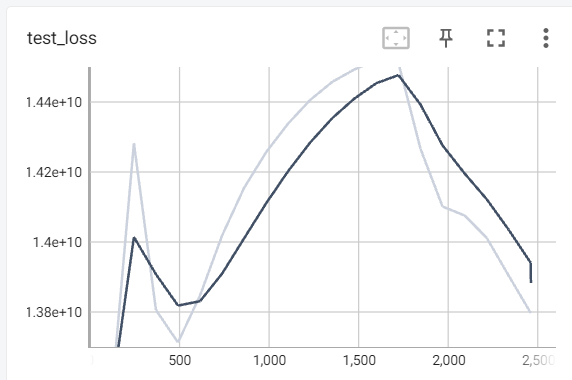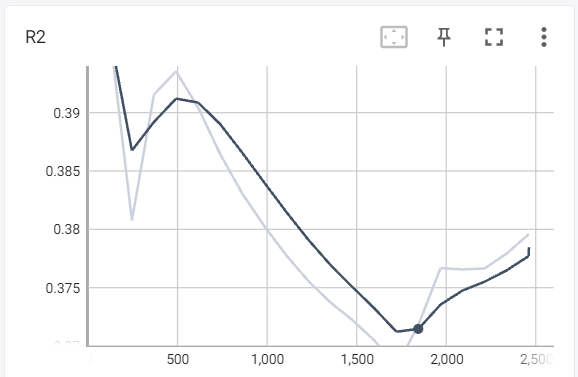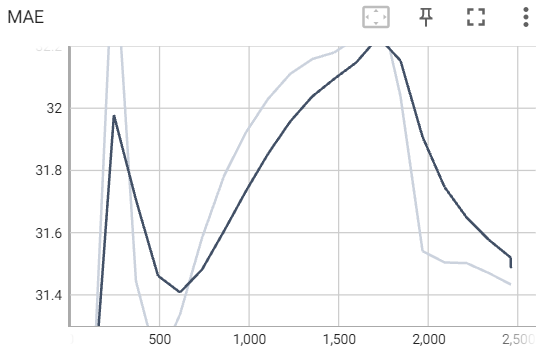

Based on the limited compute resources, we were only able to train the model for 20 epochs. However, if we had access to additional compute, it is possible that the model could have been trained for more epochs and potentially achieved better results.

In conclusion, while the model has been trained for a limited number of epochs, it still provides valuable insights and results. With additional compute resources, it is possible to train the model further and improve its performance.

## 1. Where do people predominantly go after arriving in the city, and how do they get there?

# ❓
What is the movement like in the city? To answer this question, we visualized active mobile phones in Lisbon map and created an animation for better initial visual inspection.

##### Install and import necessary libraries



In [ ]:
# Install necessary libraries
!pip install pyshp
!pip install geopandas
!pip install selenium

In [ ]:
# Import necessary libraries
import os
import io
import numpy as np
import pandas as pd
import datetime
import time
import matplotlib.pyplot as plt
import shapefile as shp
import pytz
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import geopandas as gpd
from shapely.geometry import Point
from PIL import Image, ImageDraw, ImageFont
import folium
from folium import plugins
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import geopy.distance # get distance
from geopy import Point # get Point
from geopy.geocoders import Nominatim

#fFor automation of image capture
import selenium
from selenium import webdriver
from selenium.webdriver.firefox.options import Options

os.environ["PATH"] += os.pathsep + "."

%matplotlib inline

##### Load and prepare data

In [ ]:
# Load active mobile phones data (dataset 1)
mobiles = pd.read_csv("CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv")

In [ ]:
# Load grid locations (dataset 3)
grid_locs = pd.read_excel("DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")
grid_locs.head(3)

,grelha_id,freguesia,latitude,longitude
0,1,Belém,38.692094,-9.225027
1,2,Belém,38.692094,-9.223231
2,3,Belém,38.692094,-9.221434


In [ ]:
# Convert timestamps to datetime format and rename columns
mobiles['Datetime'] = pd.to_datetime(mobiles['Datetime'])
mobiles = mobiles.sort_values(by = 'Datetime')
mobiles = mobiles.rename(columns={'Grid_ID': 'grid_id', 'Datetime': 'datetime'})

In [ ]:
# Translate column names to English
grid_locs.rename(columns={'grelha_id': 'grid_id', 'freguesia': 'parish'}, inplace=True)

In [ ]:
# Merge mobiles and grid data together for visualisation
viz_data = pd.merge(mobiles_1d, grid_locs, on='grid_id',  how='left')
viz_data.head(3)

,grid_id,datetime,C1,parish,latitude,longitude
0,3599,2022-09-01 00:00:00+00:00,23.01,Parque das Nações,38.784586,-9.097466
1,1529,2022-09-01 00:00:00+00:00,0.00,Benfica,38.735552,-9.189095
2,3309,2022-09-01 00:00:00+00:00,29.57,Lumiar,38.776183,-9.178315


In [ ]:
# Scale C1 for better visualization
scaler = MinMaxScaler()
viz_data['C1_s'] = scaler.fit_transform(viz_data['C1'].to_numpy().reshape(-1, 1))
viz_data.head(3)

,grid_id,datetime,C1,parish,latitude,longitude,C1_s
0,3599,2022-09-01 00:00:00+00:00,23.01,Parque das Nações,38.784586,-9.097466,0.004643
1,1529,2022-09-01 00:00:00+00:00,0.00,Benfica,38.735552,-9.189095,0.000000
2,3309,2022-09-01 00:00:00+00:00,29.57,Lumiar,38.776183,-9.178315,0.005967


In [ ]:
# Get coordinates of Lisbon

geolocator = Nominatim(user_agent="to_explorer")

address = 'Lisbon, Portugal'

location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

latitude = viz_data["latitude"].mean()
longitude = viz_data["longitude"].mean()

The geographical coordinates of Lisbon, Portugal are 38.7077507, -9.1365919.


In [ ]:
timestamps = viz_data['datetime'].unique()

##### Functions for visualisation

In [ ]:
# Useful functions for visualising mobile data

def get_data(time, data):
    # get data for that time
    result_data = data[data['datetime'] == time]
    return result_data

def create_map(time, df, zoom_start=12):
    # get data
    data = get_data(time, df)

    # create a map of Lisbon using latitude and longitude values
    folium_map = folium.Map(location=[latitude, longitude], 
                            zoom_start=zoom_start, width="100%")

    # add markers to the map
    for grid_id, parish, C1, lat, lon in zip(data['grid_id'], 
                                             data['parish'],
                                             data['C1_s'], 
                                             data['latitude'], 
                                             data['longitude']):
        label = 'Grid ID: {}, Parish: {}'.format(grid_id, parish)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=C1*10,
            popup=label,
            color='cadetblue',
            opacity=0.5,
            fill=True,
            fill_color='cadetblue',
            fill_opacity=0.1,
            parse_html=False).add_to(folium_map)

    return folium_map

def go_frame(i, t, data, save_path):
    
    # create the map object
    my_frame = create_map(t, data, zoom_start = 12.3)
    
    # generate the png file as a byte array
    png = my_frame._to_png()

    # now add a caption to the image to indicate the time-of-day.
    hour = int(t.hour)
    minutes = int(t.minute)
    
    # create a PIL image object
    image = Image.open(io.BytesIO(png))
    draw = ImageDraw.ImageDraw(image)
    
    # load a font
    font = ImageFont.truetype("Roboto-Light.ttf", 30)
    
    # draw time of day text
    draw.text((20,image.height - 50), 
              "datetime: {}".format(t.strftime("%d/%m/%Y, %H:%M:%S")),
              fill=(255, 255, 255), 
              font=font)
    
    # draw title
    draw.text((image.width - 400,20), 
              "Active Mobile Phones vs Time of Day",
              fill=(255, 255, 255), 
              font=font)
    
    # write to a png file
    filename = os.path.join(save_path, "frame_{:0>5}.png".format(i))
    image.save(filename, "PNG")
    return image

We create automation to save images then build animation.

In [ ]:
# Set Chrome webdriver
chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument("--headless=new")
chrome_options.add_experimental_option("excludeSwitches", ["disable-popup-blocking"])

driver = webdriver.Chrome(options=chrome_options)

In [ ]:
# create a directory to store images
!mkdir frames

In [ ]:
# loop over timestamps to create individual images of maps

for i, t in enumerate(timestamps):
    go_frame(i, t, viz_data, save_path="frames")

##### Visualising over time how people move through the grids is the best way to gain an intuition into the busiest areas and routes. We created an animation of the total mobile data available in dataset 1, which we cannot display in the notebook for technical reasons but we encourage readers to access the video available separately.

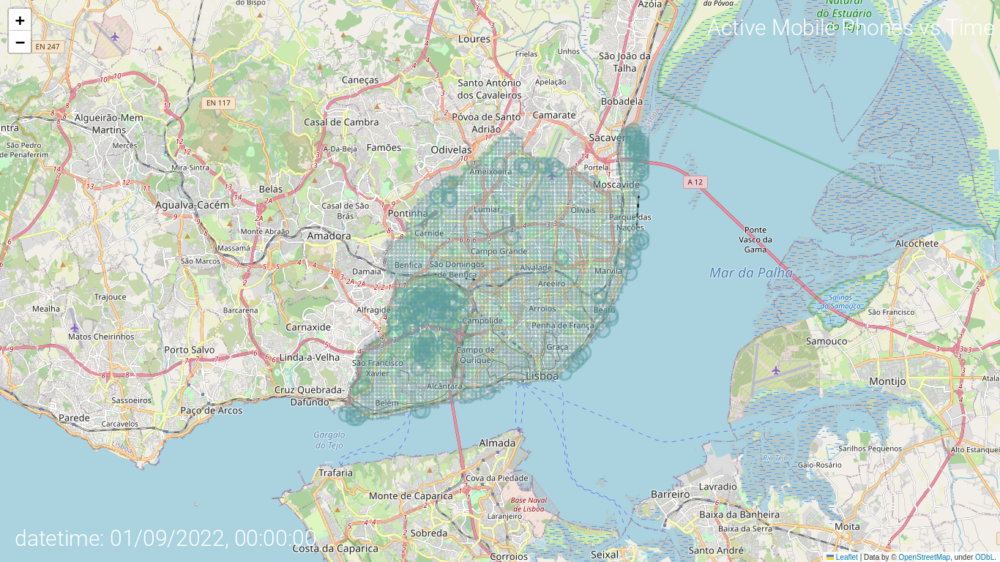

In [ ]:
go_frame(1, timestamps[0], viz_data, save_path="frames")

In [ ]:
# create the video
!ffmpeg -r 2 -i frames/frame_%05d.png -c:v libx264 -vf fps=25 -crf 17 -pix_fmt yuv420p output.mp4

### What are the strongest learned connections between axis entries and other grids?

We trained a graph neural network to predict the entry of mobile devices to a target grid from recent mobile device entries to other grids. The strength of these learned connections (edge weights in the graph) indicates that a lot of people - or more precisely, mobile devices - move from one grid to another. This can show what the most popular routes are from one grid to another.

Time constraints prevented us from predicting flow into grids from the axis roads themselves, but by finding the closest grid to each axis we get an approximation of where people go when they arrive in the city via the axes.

Below is the results of a baseline model, which we use as a placeholder for the full T-GCN graph model to demonstrate proof of concept. The baseline model is based on simple multiplication of mobile entry data, with simple weights between grids that mimic the weights in a graph network.

##### Data preprocessing

In [ ]:
# Load learned weights
data_path = "./"
weights = pd.read_csv(os.path.join(data_path, "/Baseline model/baseline_learned_parameters_gridonly.csv").set_index("Grid_ID")
weights.head()

,17,20,21,32,34,35,36,37,38,52,...,3661,3662,3675,3680,3681,3682,3694,3697,3709,3735
Grid_ID,,,,,,,,,,,,,,,,,,,,,
17,NaN,1.888185,1.317065,1.370826,1.349161,1.461573,2.014931,2.379756,1.209166,2.014136,...,1.121240,1.376203,1.310225,1.450887,1.106220,0.999821,1.222339,1.672011,1.098436,1.459407
20,0.833060,NaN,0.757096,0.940803,0.938764,0.995444,1.277282,1.493712,0.734180,1.364556,...,0.713568,0.905164,0.817089,0.926326,0.729808,0.588466,0.749776,1.062287,0.689562,0.851773
21,1.581818,2.049653,NaN,1.993534,1.765450,1.921866,2.634191,2.718652,1.197339,2.611748,...,1.186898,1.510653,1.654777,1.541851,1.355103,0.902150,1.266364,1.971925,1.198755,1.454659
32,1.723031,2.982111,2.165895,NaN,2.041095,2.015928,2.703083,3.514750,2.054861,2.696429,...,1.441408,1.755554,2.557852,2.008358,1.711236,1.466378,2.124434,3.202877,1.882313,2.855472
34,1.135192,1.738280,1.206254,1.357368,NaN,1.371880,1.840558,2.151938,1.121744,1.835469,...,1.067609,1.294685,1.094848,1.303407,0.987859,0.926350,1.093041,1.472247,1.010897,1.212065


In [ ]:
# Load and examine location data for grids (dataset 3) for plotting
grid_locs = pd.read_excel(os.path.join(data_path, "DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")).set_index("grelha_id")

In [ ]:
# Load polygons of axes (dataset 4) for plotting
axes_shp = shp.Reader(os.path.join(data_path, "DISPOSITIVOS MOVEIS_TROАOSVIA_POLIGONOS/eixos_polygon.shp"))
axis_locs = gpd.read_file(os.path.join(data_path, "DISPOSITIVOS MOVEIS_TROАOSVIA_POLIGONOS/eixos_polygon.shp"), index=0).set_index("id")

In [ ]:
# Mapping of axis names to the order of the polygons in the shapefile
axis_mapping = {0: "Ponte 25 Abril",
                1: "Marginal",
                2: "A5",
                3: "N117 (Cabos Ávila)",
                4: "IC19",
                5: "IC16",
                6: "Calçada de Carriche",
                7: "A36 (Túnel do Grilo)",
                8: "A1",
                9: "Ponte Vasco da Gama",
                10: "IC2 (Sacavém)"}

In [ ]:
# Function for finding closest grid to a given axis
def find_closest_grid(grid_locs, axis_locs, axis_id):

    # Get polygon for axis
    axis_shape = axis_locs["geometry"].loc[axis_id+1]

    # Find the grid location closest to the axis
    min_dist = np.inf
    closest_grid = np.nan
    for i, grid_point in grid_locs[["latitude", "longitude"]].iterrows():
        Point(grid_point)
        dist = Point(grid_point).distance(axis_shape)
        if dist < min_dist:
            min_dist = dist
            closest_grid = i

    return closest_grid

# Find the closest grid for all axes: we use this as a proxy for the axis itself
closest_grid = {}
for axis_id, axis_name in axis_mapping.items():
    closest_grid[axis_name] = find_closest_grid(grid_locs.loc[[x in weights.index for x in grid_locs.index]], axis_locs, axis_id)

/usr/local/lib/python3.9/dist-packages/shapely/measurement.py:74: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


In [ ]:
# Function for plotting the edge weights by axis

# This function assumes a dataframe "weights" which contains the learned edge weights between N edges in an N x N matrix, with the grid IDs (17, 20, 21, etc.) as both indices and column names

def plot_weights(ax, i_shape, grid_locs, weights, axes_shp, marker_size):

    # Set colour scale to be equal across subplots (you might want to change vmax depending on model)
    norm = Normalize(vmin=0, vmax=15)
    scalar_mappable = cm.ScalarMappable(norm=norm, cmap="RdPu")
    
    # Plot the weights for each grid
    ax.scatter(grid_locs["longitude"][weights.index],
               grid_locs["latitude"][weights.index],
               c=scalar_mappable.to_rgba(weights[str(list(closest_grid.values())[i_shape])]),
               marker="s",
               s=marker_size);

    # Overlay polygons of axes
    shape = axes_shp.shape(i_shape)
    x = [i[0] for i in shape.points[:]]
    y = [i[1] for i in shape.points[:]]
    ax.plot(x, y, "b")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(axis_mapping[i_shape])

##### Below are the grids most strongly connected to each axis: that is, as more people travel through the axis, more people enter grids which are darker in colour.

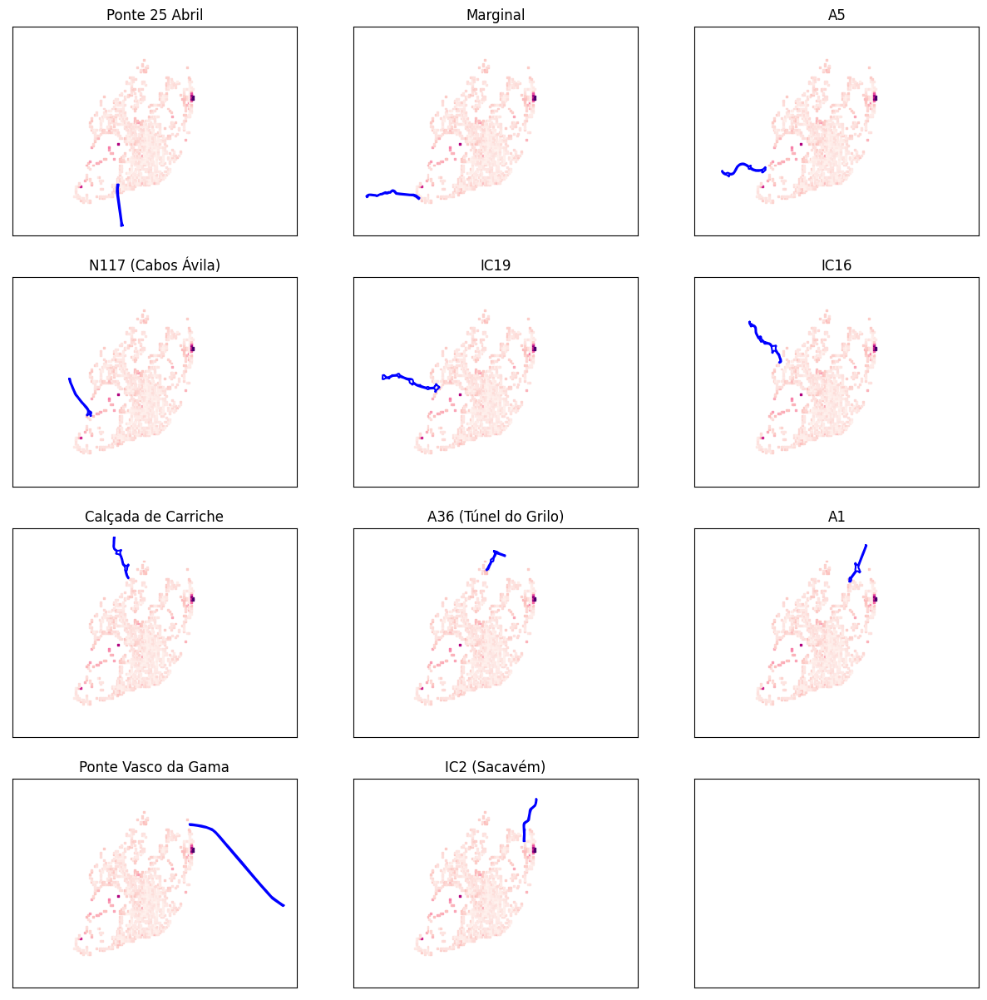

In [ ]:
# Plot weights learned by model
fig, axs = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(15, 15))
for i, ax in enumerate(axs.flat):
    plot_weights(ax, i, grid_locs, weights, axes_shp, 2)
    if i==10:
        break

plt.show()

The baseline mode 

## 2. What are the options for public transport routes and cycling infrastructure to get to the primary destinations?

Our analysis focuses on the morning rush hour. We define grids that have many more entries than exits during this period as "destination grids": this is where commuters head to to spend their day, so it is important for city planners to provide viable routes to these destinations.

First, we plot the entries - exits (excluding roaming devices) during the morning rush hour (the darker the colour, the more it serves as a destination).

c:\Users\emmar\OneDrive\Documents\Data science\World Data League 2023\Phase 1\wdl23_phase1\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.


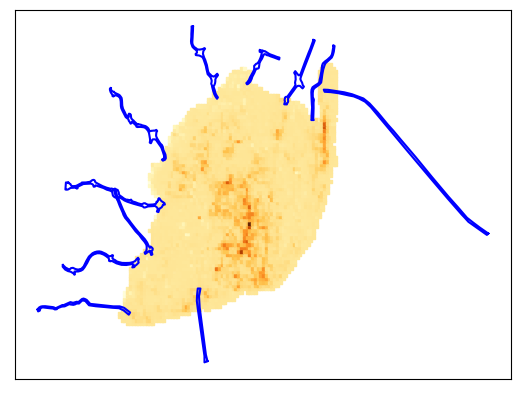

In [ ]:
# Extract time from Datetime
grid_train["time"] = grid_train.index.map(lambda x: datetime.strptime(x, "%Y-%m-%d %H:%M:%S%z").time())

# Extract day of week from Datetime
grid_train["day"] = grid_train.index.map(lambda x: datetime.strptime(x,"%Y-%m-%d %H:%M:%S%z").weekday())

# Calculate mean entries and exits for each grid during morning rush hour (7am - 10am)
is_morning_rushour = (grid_train["time"] >= time(hour=7, minute=0)) & (grid_train["time"] <= time(hour=10, minute=0))
grid_ids = grid_train["non-roaming_entries"].columns
mean_entries_minus_exits = pd.Series(index=grid_ids)
for grid_id in grid_ids:
    mean_entries_minus_exits[grid_id] = np.mean(grid_train["entries-minus-exits"][grid_id].loc[is_morning_rushour])
    
# Load and examine location data for grids (dataset 3)
grid_locs = pd.read_excel("DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")

# Plot the entries - exits during morning rush hour
plt.scatter(grid_locs["longitude"], grid_locs["latitude"], c=mean_entries_minus_exits, cmap="YlOrBr", marker="s", s=5);

# Overlay polygons of axes
for shape in axes_shp.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    plt.plot(x, y, "b")
plt.xticks(ticks=[])
plt.yticks(ticks=[]);

Next, we focus our analysis down to the top destination grids, which we define as those which exceed the 95th percentile of entries-exits during morning rush hour.

There are 188 grids in the top 5% of people entering minus people exiting during morning rush hours.
In total, an average of 41,759 people per hour arrive at these grids per hour without leaving.


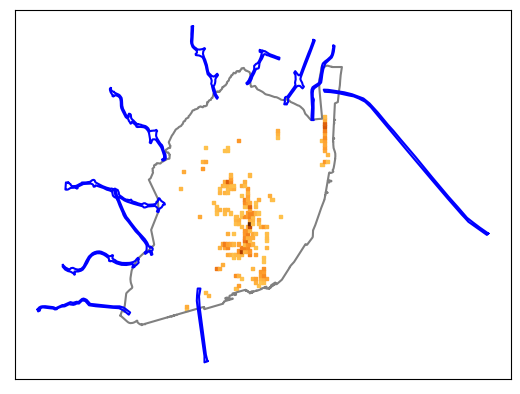

In [ ]:
# Get e.g. 95th percentile of mean entries minus exits
percentile_threshold = 0.95
threshold = np.quantile(mean_entries_minus_exits, percentile_threshold)

# Find the grids which meet this threshold
destination_idx = np.where(mean_entries_minus_exits >= threshold)[0]

# Report destination grids
print("There are {} grids in the top {:.0%} of people entering minus people exiting during morning rush hours.".format(len(destination_idx), 1-percentile_threshold))
print("In total, an average of {:,.0f} people per hour arrive at these grids per hour without leaving.".format(np.sum(mean_entries_minus_exits.iloc[destination_idx] * 4)))

# Set colour scale
norm = Normalize(vmin=mean_entries_minus_exits.min(), vmax=mean_entries_minus_exits.max())
scalar_mappable = cm.ScalarMappable(norm=norm, cmap="YlOrBr")

# Plot outline of Lisbon
outline = ox.geocode_to_gdf("Lisbon")
fig, ax = plt.subplots(1, 1)
ax.plot(outline["geometry"][0].exterior.xy[0], outline["geometry"][0].exterior.xy[1], "gray")

# Plot the entries - exits during morning rush hour
ax.scatter(grid_locs["longitude"].iloc[destination_idx],
            grid_locs["latitude"].iloc[destination_idx],
            c=scalar_mappable.to_rgba(mean_entries_minus_exits.iloc[destination_idx]),
            cmap="YlOrBr",
            marker="s",
            s=5);

# Overlay polygons of axes
for shape in axes_shp.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    ax.plot(x, y, "b")
plt.xticks(ticks=[])
plt.yticks(ticks=[]);

The first big question is how well existing public infrastructre serves these destinations: how easy is it to arrive there by train, metro, tram, river transport, or bus?

In [ ]:
# What is the average distance to rail/metro stations in these grids?
metro = pd.read_csv("./Additional data/POITransportes.csv")

from sklearn.metrics.pairwise import haversine_distances
destination_grids = grid_locs[["longitude", "latitude"]].iloc[destination_idx]
dist_metro = haversine_distances(destination_grids, metro[["X", "Y"]]) * 637.1
print("Average distance from destination grids to nearest metro/rail station is {:.1f} km".format(np.median(np.min(dist_metro, axis=1))))
print("There are on average {:.0f} metro/rail station(s) within 1km of destination grid centres".format(np.median(np.sum(dist_metro < 1, axis=1))))


Average distance from destination grids to nearest metro/rail station is 2.0 km
There are on average 0 metro/rail station(s) within 1km of destination grid centres


In [ ]:
# Get tram stops
tram_stops = ox.geometries_from_place("Lisbon", tags={'railway': 'tram_stop'})

# Extract the x and y coordinates of each tram stop
tram_stops["X"] = tram_stops['geometry'].apply(lambda p: p.x)
tram_stops["Y"] = tram_stops['geometry'].apply(lambda p: p.y)

dist_tram = haversine_distances(destination_grids, tram_stops[["X", "Y"]]) * 637.1
print("Average distance from destination grids to nearest tram stop is {:.1f} km".format(np.median(np.min(dist_tram, axis=1))))
print("There are on average {:.0f} tram stop(s) within 1km of destination grid centres".format(np.median(np.sum(dist_tram < 1, axis=1))))


Average distance from destination grids to nearest tram stop is 7.2 km
There are on average 0 tram stop(s) within 1km of destination grid centres


In [ ]:
# What is the average distance to river transport stations in these grids?
river = pd.read_csv("./Additional data/Boat.csv")
dist_river = haversine_distances(destination_grids, river[["X", "Y"]]) * 637.1
print("Average distance from destination grids to nearest river transport station is {:.1f} km".format(np.median(np.min(dist_river, axis=1))))
print("There are on average {:.0f} river transport station(s) within 1km of destination grid centres".format(np.median(np.sum(dist_river < 1, axis=1))))



Average distance from destination grids to nearest river transport station is 14.6 km
There are on average 0 river transport station(s) within 1km of destination grid centres


In [ ]:
# Get bus stops from OpenStreetMap
import osmnx as ox
gdf = ox.geocode_to_gdf("Lisbon")
polygon = gdf['geometry'].iloc[0]
bus_stops = ox.geometries_from_place("Lisbon", tags={'highway': 'bus_stop'})

# Extract the x and y coordinates of each bus stop
bus_stops["X"] = bus_stops['geometry'].apply(lambda p: p.x)
bus_stops["Y"] = bus_stops['geometry'].apply(lambda p: p.y)

dist_bus = haversine_distances(destination_grids, bus_stops[["X", "Y"]]) * 637.1
print("Average distance from destination grids to nearest bus stop is {:.1f} km".format(np.median(np.min(dist_bus, axis=1))))
print("There are on average {:.0f} bus stop(s) within 1km of destination grid centres".format(np.median(np.sum(dist_bus < 1, axis=1))))


Average distance from destination grids to nearest bus stop is 0.5 km
There are on average 3 bus stop(s) within 1km of destination grid centres


Conclusion: destination grids are typically far from train stations, tram stops, and river transport stops. They are better served by bus stops, but nevertheless there is a substantial last-mile problem to be met to enable commuters to conveniently get from their origins outside the city to the most common destinations.

Possible solutions are:
* increasing bus routes from outside the city to serve the destination grids
* increasing the number of bus stops at the destination grids, to minimise time to walk from bus stop to final destination
* support cycling infrastructure to enable connections with other public transport routes 

Next is an examination of the cycling infrastructure with respect to the destination grids. How easy is it to arrive at the destination grids by bicycle, whether own bicycle or shared Gira bike?

In [ ]:
bike = pd.read_csv("./Additional data/Bikes.csv")

# Extract the x and y coordinates of each bike station
bike["coordinates"] = bike['position'].apply(lambda x: x.split("[")[1].split("]")[0].split(", "))

bike["X"] = bike['coordinates'].apply(lambda p: float(p[0]))
bike["Y"] = bike['coordinates'].apply(lambda p: float(p[1]))

dist_bike = haversine_distances(destination_grids, bike[["X", "Y"]]) * 637.1
print("Average distance from destination grids to nearest bicycle docking station is {:.1f} km".format(np.median(np.min(dist_bike, axis=1))))

print("There are on average {:.0f} bicycle docking station(s) within 500m of destination grid centres".format(np.median(np.sum(dist_bike < 0.5, axis=1))))

Average distance from destination grids to nearest bicycle docking station is 1.2 km
There are on average 0 bicycle docking station(s) within 500m of destination grid centres


c:\Users\emmar\OneDrive\Documents\Data science\World Data League 2023\Phase 1\wdl23_phase1\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


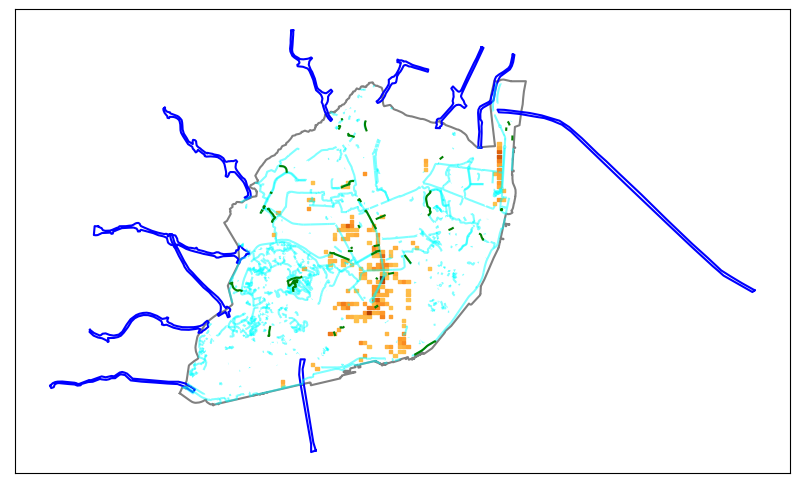

In [ ]:
# Load cycle routes
cycleways = ox.geometries_from_place("Lisbon", tags={'highway': ['cycleway', 'path'], 'cycleway': 'lane'})
cycle_routes = pd.read_json("./Additional data/cycle_routes.json")

# Plot the entries - exits during morning rush hour
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(grid_locs["longitude"].iloc[destination_idx],
            grid_locs["latitude"].iloc[destination_idx],
            c=scalar_mappable.to_rgba(mean_entries_minus_exits.iloc[destination_idx]),
            cmap="YlOrBr",
            marker="s",
            s=5);

# Plot outline of Lisbon
outline = ox.geocode_to_gdf("Lisbon")
ax.plot(outline["geometry"][0].exterior.xy[0], outline["geometry"][0].exterior.xy[1], "gray")

# Overlay polygons of axes
for shape in axes_shp.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    ax.plot(x, y, "b")
ax.set_xticks(ticks=[])
ax.set_yticks(ticks=[])

def get_x(geom):
    if geom["geometry"]["type"]=="LineString":
        x = [y[0] for y in geom["geometry"]["coordinates"]]
    elif geom["geometry"]["type"]=="MultiLineString":
        x = [[y[0] for y in z] for z in geom["geometry"]["coordinates"]]
    return x

def get_y(geom):
    if geom["geometry"]["type"]=="LineString":
        y = [y[1] for y in geom["geometry"]["coordinates"]]
    elif geom["geometry"]["type"]=="MultiLineString":
        y = [[y[1] for y in z] for z in geom["geometry"]["coordinates"]]
    return y

# Overlay cycleways in pale cyan (from OpenStreetMap)
cycleways.plot(ax=ax, edgecolor='cyan', alpha=0.5)

# Overlay cycle routes in green(from Lisbon's own data)
cycle_routes["X"] = cycle_routes["features"].apply(lambda x: get_x(x))
cycle_routes["Y"] = cycle_routes["features"].apply(lambda x: get_y(x))
for i, row in cycle_routes.iloc[:47].iterrows():
    try:
        ax.plot(row["X"], row["Y"], "g")
    except:
        continue

Conclusion: although there is a lot of cycling infrastructure distributed around the city, data provided by both Lisboa Aberta and OpenStreetMap indicate it is fairly sparse in the destination grids. Adding more cycling infrastructure to connect the desination grids with the surrounding metropolitan area (where commuters start their journeys from), and entrypoints to the city such as train stations and river transport stations, would make it easier for commuters to switch away from cars to more sustainable methods partly or wholly based on cycling. For last-mile mobility, i.e. connecting destination grids with entrypoints, more Gira bike stations located in the destination grids would make cycling a faster and more attractive option for those who don't own their own bicycle or don't want to carry a bicycle with them.

## 3. If commuter routes into the city via the 11 axes can be modified (for example, by taking train instead), what would be the impact on flow?

We have developed a model which can predict the mobile entries to a grid from recent entries and exits at the same grid and surrounding grids. This can be used as a simulation, where the effect of modifying the flow through one grid can be observed in other grids. First, we plot the model predictions for the real mobile entries, on the last two weeks of the dataset period (16th - 20th November). The model was not trained on this data.

### Predict test data, average over all weekdays to get an average per time of day, and visualise (this is the starting point)


In [ ]:
# Load test data
test_data = pd.read_csv(os.path.join(data_path, "grid_test_125.csv"), header=[0, 1], index_col=0)

In [ ]:
# Infer grid entries for all timestamps in the test data
def baseline_predict(test_data, weights):

    # Empty dataframe of predicted values
    grid_names = weights.index.astype(str)
    y_pred = pd.DataFrame(index=test_data.index, columns=grid_names)

    # Predict entries for each grid at each timestep
    grid_names = test_data["non-roaming_entries"].columns
    for dt, row in test_data.iterrows():
        for grid_id in grid_names:
            y_pred[grid_id][dt] = np.mean(row["non-roaming_entries"] * weights[grid_id])

    # Return dataframe of predictions
    return y_pred

weights = pd.read_csv("baseline_learned_parameters_gridonly.csv").set_index("Grid_ID")
y_pred = baseline_predict(test_data, weights)

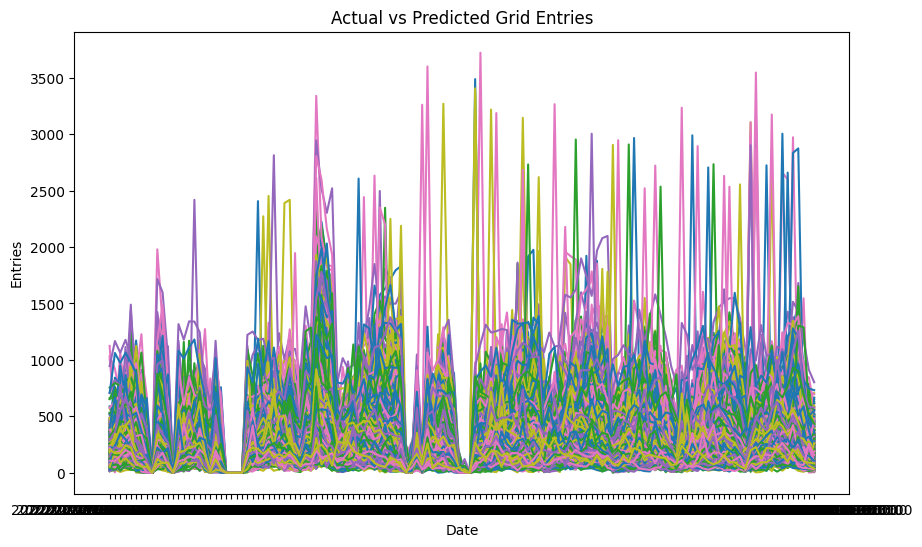

In [ ]:
# Plot the predicted grid entries vs actual grid entries (line chart?)
fig, ax = plt.subplots(figsize=(10, 6))

# Iterate over each grid and plot actual vs predicted values
for grid in test_data["non-roaming_entries"].columns:
    ax.plot(test_data.index, test_data["non-roaming_entries"][grid], label=f"{grid} actual")
    ax.plot(y_pred.index, y_pred[grid], label=f"{grid} predicted")

# Set plot title and axis labels
ax.set_title("Actual vs Predicted Grid Entries")
ax.set_xlabel("Date")
ax.set_ylabel("Entries")

# Show the plot
plt.show()

In [ ]:
# Average predicted grid entries by time of day
y_pred.index = pd.to_datetime(y_pred.index)
y_pred["time"] = y_pred.index.time
y_pred_average = y_pred.groupby("time").mean()

In [ ]:
# Plot a 4D visualisation of the average predicted grid entries

What if commuters were persuaded to avoid one axis, for example by taking the train instead, reducing the entry via this axis by 25% or 50%? What if the capacity via one axis was increased by improving cycling infrastructure and increasing cycling capacity, boosting the entry via this axis by 25% or 50%? Our graph model can predict the effects on movement of people around the city.

In [ ]:
# Modify one axis entry (choose the busiest one?) and change its entries in the test data by -50%, -25%, +50%, +200%
axis_name = "Ponte 25 Abril"

# Create a function with inputs: test dataframe, grid_id, factor by which to multiply grid data, learned edge weights
def manipulate_flow(test_data, axis_name, mult_factor, weights):

    # Select the axis's closest grid
    grid_id = closest_grid[axis_name]

    # For every rush hour point, multiply the entry and exit for this grid by 0.5
    try:
      test_data[str(grid_id)] = test_data[str(grid_id)] * mult_factor
    except:
      pass

    # Infer entries for all other grids
    y_pred = baseline_predict(test_data, weights)

    # Average over days
    y_pred.index = pd.to_datetime(y_pred.index)
    y_pred["time"] = y_pred.index.time
    y_pred_average = y_pred.groupby("time").mean()

    # Visualise
    fig, axs = plt.subplots(4, 3, sharex=True, sharey=True, figsize=(15, 15))
    for i, ax in enumerate(axs.flat):
        plot_weights(ax, i, grid_locs, y_pred_average, axes_shp, 5)
        if i==10:
            break

    plt.show()

In [ ]:
manipulate_flow(test_data, axis_name,0.5,weights)

In [ ]:
# Repeat the inference and visualisation with the axis entries modified

## Carbon Emissions calculation

In [3]:
ds7_01 = pd.read_csv("CML_waze_jams_092022_1.csv")
ds7_01["date"] = ds7_01["entity_ts"].map(lambda x: x[:10])
ds7_01["date"] = pd.to_datetime(ds7_01["date"])
ds7_01["delay"] = ds7_01["delay"]
df = ds7_01.groupby(['date']).aggregate({'length': 'sum', 'delay': 'sum', 'speed': 'mean'})

In [4]:
avg_length = df['length'].mean()
avg_delay = df['delay'].mean()
avg_speed = df['speed'].mean()

# 84.7 g/kg fuel and 0.755 kilograms per liter 
# 3.941 × 10 −6 L/(m ⋅ s) or 4 × 10 −6 L/(m ⋅ s)

84.7 * 0.755 * 4 * 10**-6 * avg_length * avg_delay / 10**6

15407.026734406032